Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


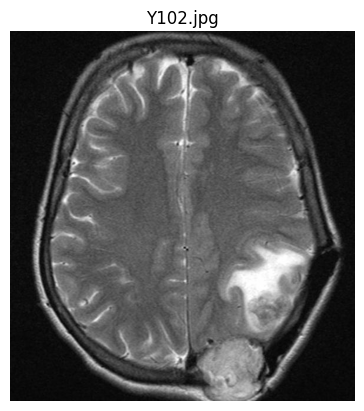

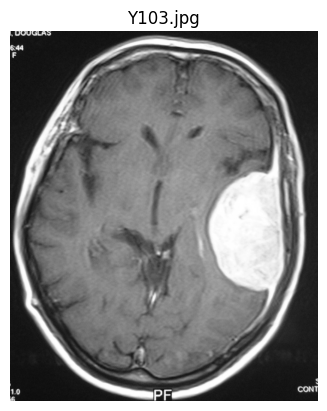

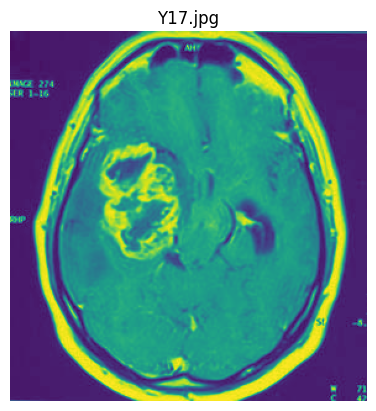

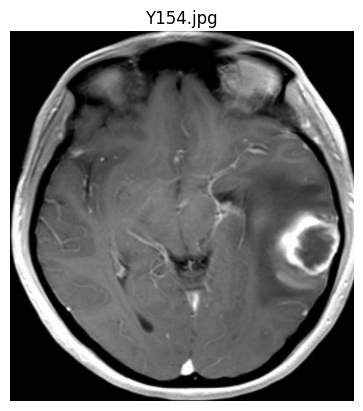

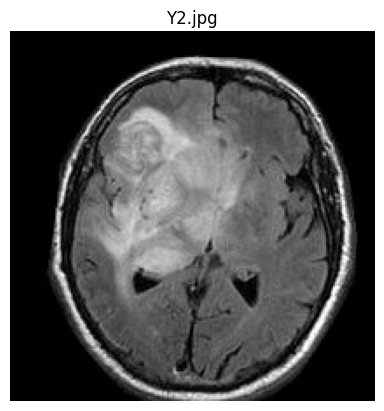

...

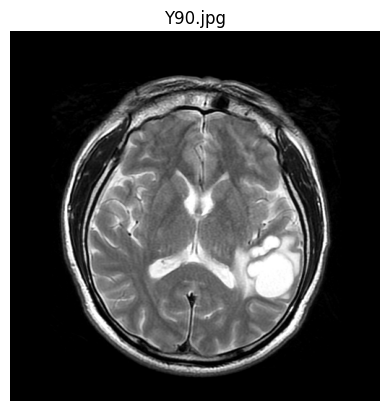

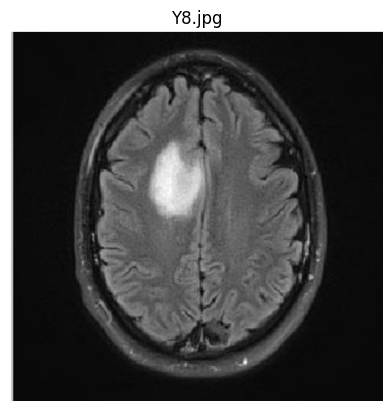

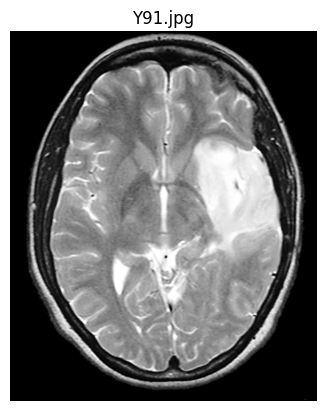

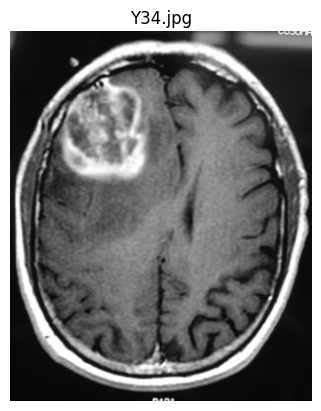

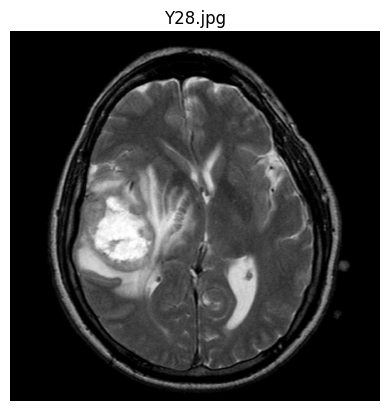

Epoch 1/10
7/7 [==============================] - 8s 972ms/step - loss: 0.7999 - accuracy: 0.6485 - val_loss: 0.5909 - val_accuracy: 0.6667
Epoch 2/10
7/7 [==============================] - 8s 1s/step - loss: 0.5371 - accuracy: 0.7525 - val_loss: 0.4914 - val_accuracy: 0.8039
Epoch 3/10
7/7 [==============================] - 7s 938ms/step - loss: 0.5188 - accuracy: 0.7822 - val_loss: 0.4675 - val_accuracy: 0.8039
Epoch 4/10
7/7 [==============================] - 8s 1s/step - loss: 0.4459 - accuracy: 0.8119 - val_loss: 0.4374 - val_accuracy: 0.8235
Epoch 5/10
7/7 [==============================] - 7s 957ms/step - loss: 0.3873 - accuracy: 0.8267 - val_loss: 0.3843 - val_accuracy: 0.8627
Epoch 6/10
7/7 [==============================] - 8s 1s/step - loss: 0.3491 - accuracy: 0.8564 - val_loss: 0.3865 - val_accuracy: 0.8431
Epoch 7/10
7/7 [==============================] - 6s 888ms/step - loss: 0.2895 - accuracy: 0.8960 - val_loss: 0.3435 - val_accuracy: 0.9216
Epoch 8/10
7/7 [=============

In [ ]:
# import os
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg
# import numpy as np
# import cv2
# from sklearn.model_selection import train_test_split
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
# from tensorflow.keras.utils import to_categorical
# from google.colab import drive

# # Mount Google Drive
# drive.mount('/content/gdrive')

# # Function to print all images in a folder
# def print_images(folder):
#     for filename in os.listdir(folder):
#         if filename.endswith(('.jpg', '.jpeg', '.png')):  # Check if the file is an image
#             img_path = os.path.join(folder, filename)
#             img = mpimg.imread(img_path)
#             plt.imshow(img)
#             plt.title(filename)  # Use filename as the title
#             plt.axis('off')  # Turn off axis
#             plt.show()

# # Specify the folder containing the images
# # folder_path = '/content/gdrive/MyDrive/yes'  # Replace with the path to your folder

# # Print all images in the folder
# print_images(folder_path)

# # Function to load and preprocess images from the directory
# def load_images_from_folder(folder):
#     images = []
#     for filename in os.listdir(folder):
#         img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
#         if img is not None:
#             img = cv2.resize(img, (150, 150))  # Resize image to ensure uniform dimensions
#             images.append(img)
#     return images

# # Load images and labels
# yes_images = load_images_from_folder('/content/gdrive/MyDrive/yes')  # Folder containing images of people with brain tumor
# no_images = load_images_from_folder('/content/gdrive/MyDrive/no')    # Folder containing images of people without brain tumor

# # Preprocess images and labels
# X_yes = np.array(yes_images)
# X_no = np.array(no_images)
# X = np.concatenate([X_yes, X_no]) / 255.0  # Normalize pixel values
# y = np.concatenate([np.ones(len(X_yes)), np.zeros(len(X_no))])  # Labels (1 for yes, 0 for no)
# y = to_categorical(y)  # Convert labels to one-hot encoding

# # Split data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Define the model
# model = Sequential()
# model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))  # Adjust input shape according to image dimensions
# model.add(MaxPooling2D((2, 2)))
# model.add(Conv2D(64, (3, 3), activation='relu'))
# model.add(MaxPooling2D((2, 2)))
# model.add(Flatten())
# model.add(Dense(64, activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(2, activation='softmax'))  # Output layer with 2 units (yes or no)

# # Compile the model
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# # Train the model
# model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# # Evaluate the model
# loss, accuracy = model.evaluate(X_test, y_test)
# print("Test Loss:", loss)
# print("Test Accuracy:", accuracy)


In [ ]:
e.
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from google.colab import drive

# Mount Google Drive
drive.mount('/content/gdrive')

# Function to print all images in a folder
def print_images(folder):
    for filename in os.listdir(folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):  # Check if the file is an image
            img_path = os.path.join(folder, filename)
            img = mpimg.imread(img_path)
            plt.imshow(img)
            plt.title(filename)  # Use filename as the title
            plt.axis('off')  # Turn off axis
            plt.show()

# Function to load and preprocess images from the directory
def load_images_and_labels(folder_paths):
    images = []
    labels = []
    filenames = []
    for i, folder_path in enumerate(folder_paths):
        for filename in os.listdir(folder_path):
            img = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)
            if img is not None:
                img = cv2.resize(img, (150, 150))  # Resize image to ensure uniform dimensions
                images.append(img)
                labels.append(i)  # Assign label based on folder index (0 for no, 1 for yes)
                filenames.append(filename)  # Store filename
    return images, labels, filenames

# Load images, labels, and filenames
yes_folder = '/content/gdrive/MyDrive/yes'  # Folder containing images of people with brain tumor
no_folder = '/content/gdrive/MyDrive/no'    # Folder containing images of people without brain tumor
images, labels, filenames = load_images_and_labels([no_folder, yes_folder])

# Preprocess images and labels
X = np.array(images) / 255.0  # Normalize pixel values
y = to_categorical(labels)  # Convert labels to one-hot encoding

# Split data into training and testing sets
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(X, y, filenames, test_size=0.2, random_state=42)

# Define the model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 1)))  # Adjust input shape according to image dimensions
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))  # Output layer wi  th 2 units (yes or no)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

# Predict on all images
predictions = model.predict(X)

# Classify images based on predictions
tumor_images = []
non_tumor_images = []
for i, pred in enumerate(predictions):
    if np.argmax(pred) == 1:
        tumor_images.append(filenames[i])
    else:
        non_tumor_images.append(filenames[i])

print("Images with Tumor:", tumor_images)
print("Images without Tumor:", non_tumor_images)


Mounted at /content/gdrive
Epoch 1/10
7/7 [==============================] - 8s 875ms/step - loss: 0.9237 - accuracy: 0.5990 - val_loss: 0.5505 - val_accuracy: 0.7843
Epoch 2/10
7/7 [==============================] - 7s 964ms/step - loss: 0.5642 - accuracy: 0.7327 - val_loss: 0.5105 - val_accuracy: 0.8039
Epoch 3/10
7/7 [==============================] - 6s 791ms/step - loss: 0.5053 - accuracy: 0.7921 - val_loss: 0.4866 - val_accuracy: 0.8039
Epoch 4/10
7/7 [==============================] - 7s 1s/step - loss: 0.4667 - accuracy: 0.7871 - val_loss: 0.4785 - val_accuracy: 0.8235
Epoch 5/10
7/7 [==============================] - 6s 859ms/step - loss: 0.3994 - accuracy: 0.8218 - val_loss: 0.4868 - val_accuracy: 0.8431
Epoch 6/10
7/7 [==============================] - 6s 804ms/step - loss: 0.3234 - accuracy: 0.8564 - val_loss: 0.5233 - val_accuracy: 0.8431
Epoch 7/10
7/7 [==============================] - 7s 1s/step - loss: 0.2576 - accuracy: 0.8960 - val_loss: 0.5676 - val_accuracy: 0.8235

In [ ]:
print("Images without Tumor:", non_tumor_images)


NameError: name 'non_tumor_images' is not defined